**This Data Challenge was made by Pedro Seixas and Rita Peixoto**

In [24]:
import numpy as np
import pandas as pd
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import urllib.request
from io import StringIO
import seaborn as sns
from scipy import signal
import sklearn
import sklearn.cluster
from sklearn import metrics
from skimage import measure
import cv2
import keras
from keras.datasets import mnist
from keras.layers import Dense
from keras.models import Sequential

Populating the interactive namespace from numpy and matplotlib


# Data Challenge - Traffic

The task is to build an algorithm for prohibitory traffic sign recognition. First we need to load the images.

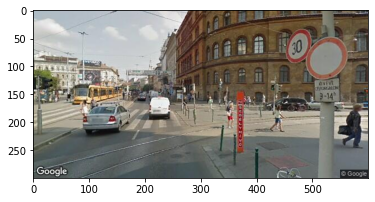

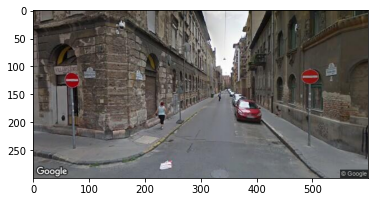

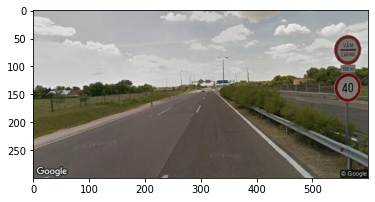

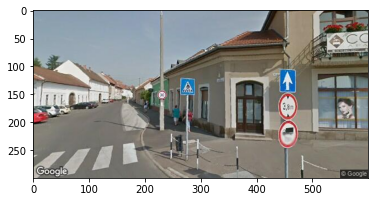

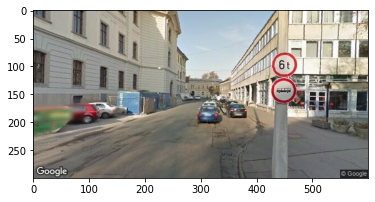

...

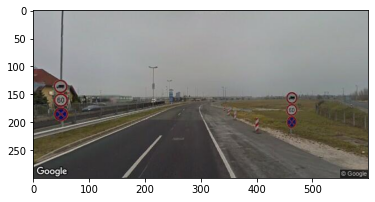

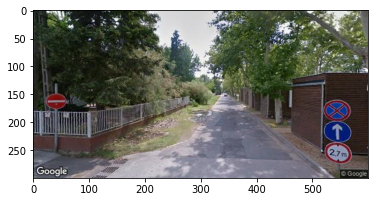

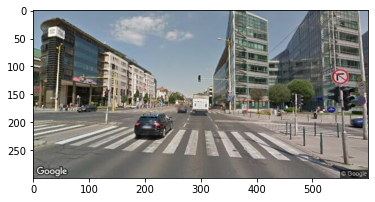

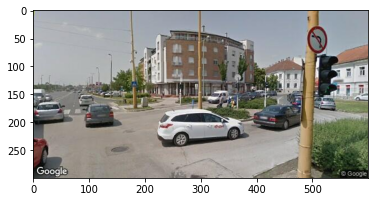

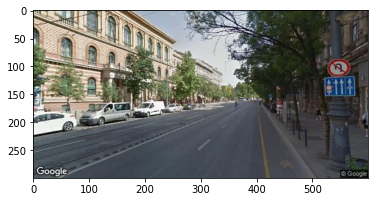

In [25]:
images = []

path = "/content/drive/MyDrive/traffic/training_images/_/"

for i in range(1, 21):
  img_path = path + str(i) + ".jpg"
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  images.append(img)
  imgplot = plt.imshow(img)
  plt.show()

## Image Segmentation

Segment the images by the red color, so we can get all the traffic signs. If we wanted to find all possible traffic signs, we would need to segment not only by red color, but for this data challenge is enough.

Images are converted to HSV because it is easier to segment by color in that way. Using [this](https://stackoverflow.com/questions/10948589/choosing-the-correct-upper-and-lower-hsv-boundaries-for-color-detection-withcv) stackoverflow question, we could find the correct ranges for the red color, which are two since it is at the lower and the higher side of the spectrum.

After the segmentation, a blur was applied to remove some noise.

In [26]:
def apply_segmentation(img):
  hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

  lower_red_hue_range = cv2.inRange(hsv, np.array([0,70,60]), np.array([10,255,255]))
  higher_red_hue_range = cv2.inRange(hsv, np.array([170,70,60]), np.array([179,255,255]))

  red_hue_image = cv2.addWeighted(lower_red_hue_range, 1.0, higher_red_hue_range, 1.0, 0.0)

  out = cv2.medianBlur(red_hue_image, 5)

  return out

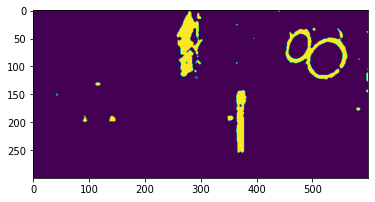

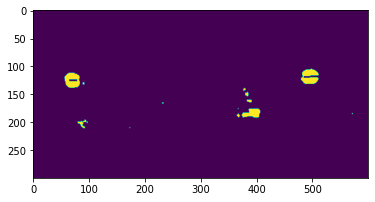

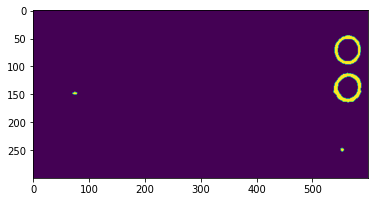

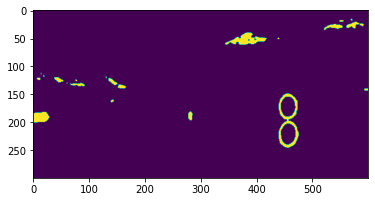

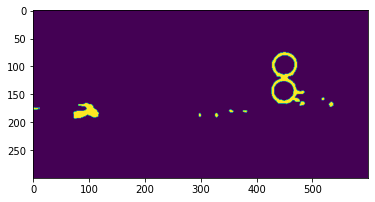

...

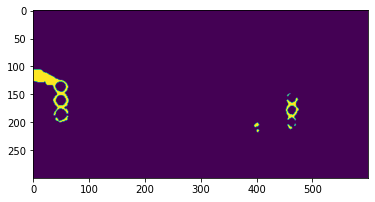

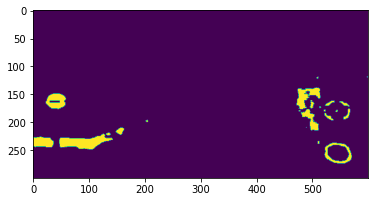

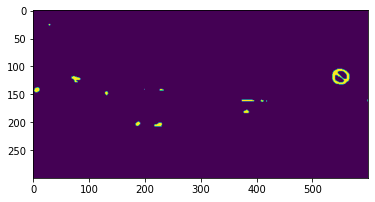

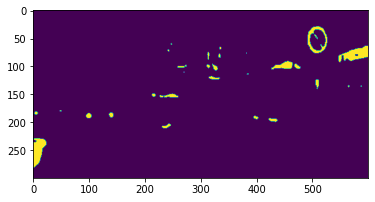

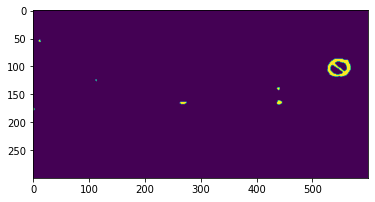

In [27]:
segmented_images = list(map(apply_segmentation, images))

for img in segmented_images:
  imgplot = plt.imshow(img)
  plt.show()

## Connected Components

In [28]:
def plot_image_with_circles(img, circles):
  fig, (ax1) = plt.subplots(1,figsize=(10,10))
  plt.xticks([]),plt.yticks([])
  ax1.imshow(img);

  for circle in circles[0]:
    rectBorder = matplotlib.patches.Circle((circle[0], circle[1]), circle[2], edgecolor="red", linewidth=2, fill=False)
    ax1.add_patch(rectBorder)

  plt.show()

In order to find the traffic signs, the function HoughCircles was used, since it can regognize circular patterns in images. Adjusting the parameters, we could get a pretty satisfatory result, although not all street signs were recognized.

In [29]:
def find_circles(img, source):
  circles = cv2.HoughCircles(img, cv2.HOUGH_GRADIENT, 1, img.shape[0] / 16, param1 = 100, param2 = 16, minRadius = 6, maxRadius = 35)
  print("Centers:", circles)

  if circles is None: circles = [[]]

  plot_image_with_circles(source, circles)

  return circles

Centers: [[[521.5  88.5  34.4]
  [468.5  62.5  22.9]]]


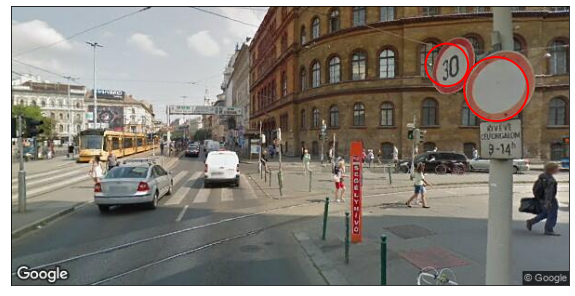

Centers: [[[ 69.5 124.5  13.4]]]


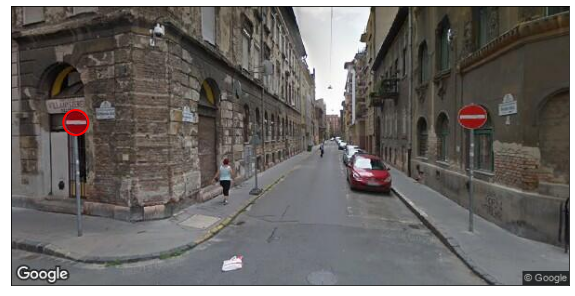

Centers: [[[563.5 138.5  18.1]
  [565.5  70.5  20.5]]]


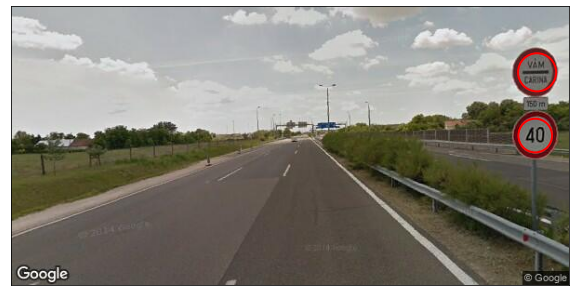

Centers: [[[456.5 220.5  18.5]
  [460.5 171.5  18. ]]]


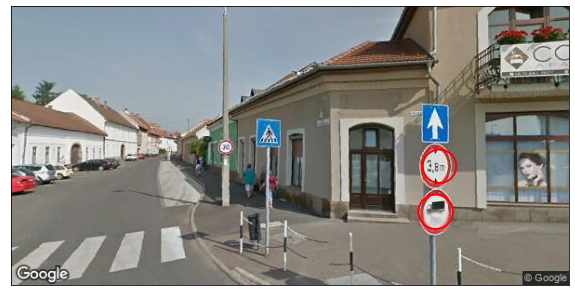

Centers: [[[448.5 143.5  17.7]
  [449.5  96.5  22.7]]]


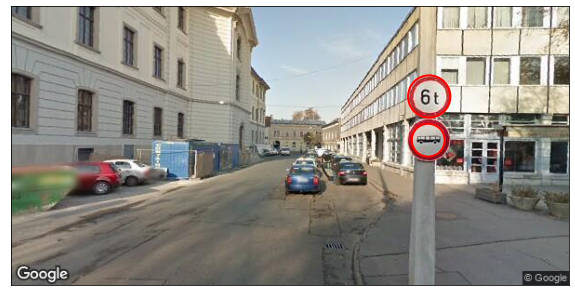

Centers: [[[525.5 135.5  16.6]
  [576.5 118.5  21.7]]]


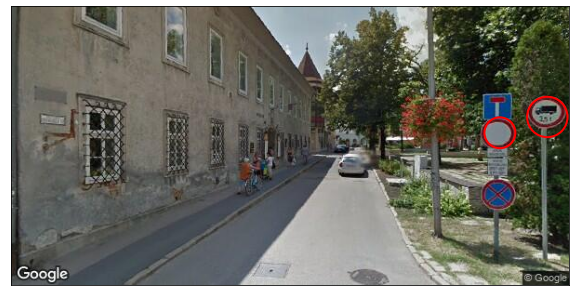

Centers: [[[473.5 206.5  21. ]
  [472.5 157.5  19.4]]]


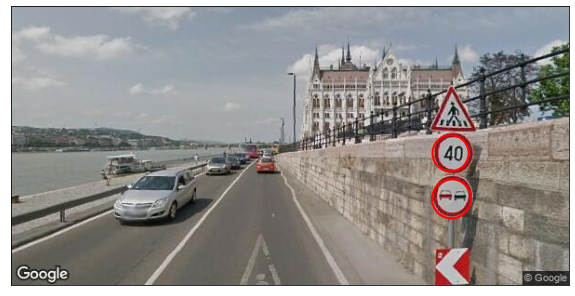

Centers: [[[541.5 152.5  16.9]
  [536.5 205.5  16. ]]]


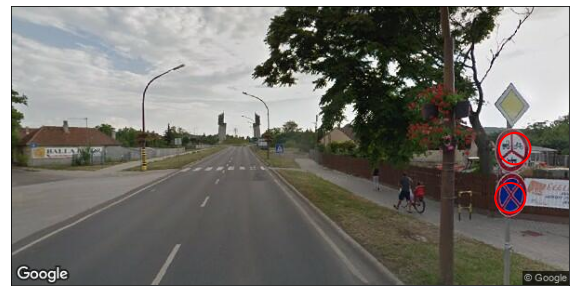

Centers: None


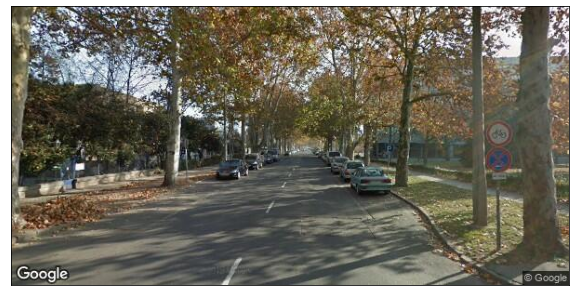

Centers: [[[539.5 125.5  15.8]
  [224.5 187.5  10.2]]]


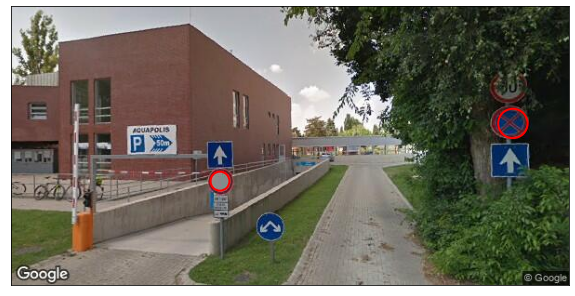

Centers: None


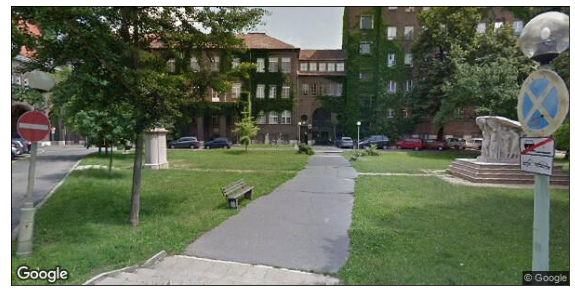

Centers: [[[537.5 198.5  13.8]
  [538.5 159.5  16.7]]]


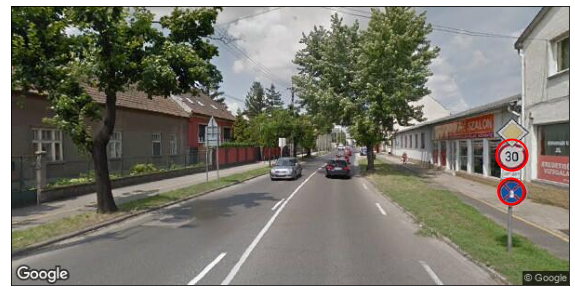

Centers: [[[444.5 133.5   9.6]
  [444.5 106.5  11. ]]]


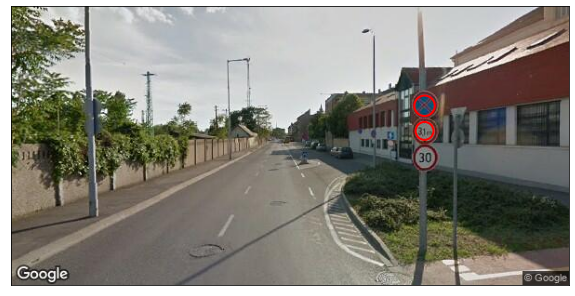

Centers: [[[483.5 185.5  22.9]]]


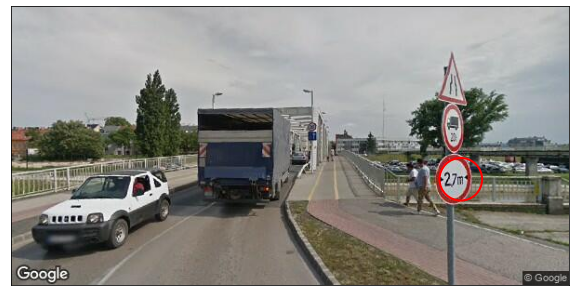

Centers: [[[467.5 107.5  14.1]
  [470.5  42.5  12.7]
  [473.5  78.5  15.9]]]


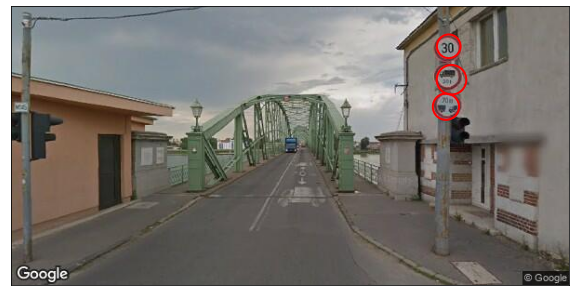

Centers: [[[ 49.5 186.5  12.7]
  [ 48.5 160.5   9.6]
  [ 49.5 135.5   9.4]
  [462.5 177.5   7.3]]]


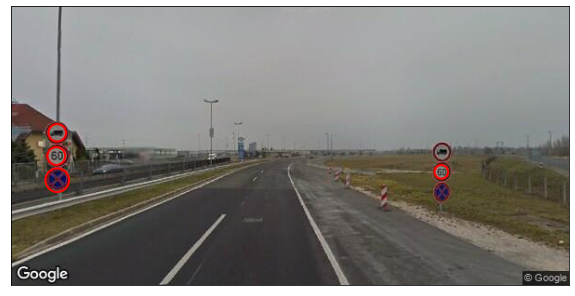

Centers: [[[547.5 257.5  20.7]]]


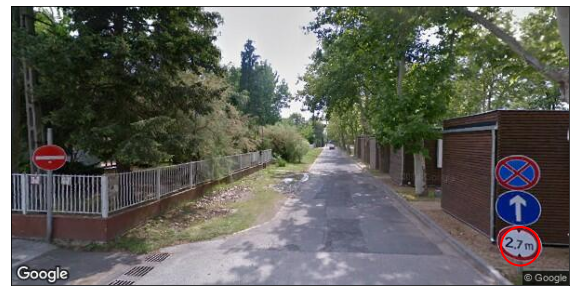

Centers: [[[550.5 116.5  15.6]]]


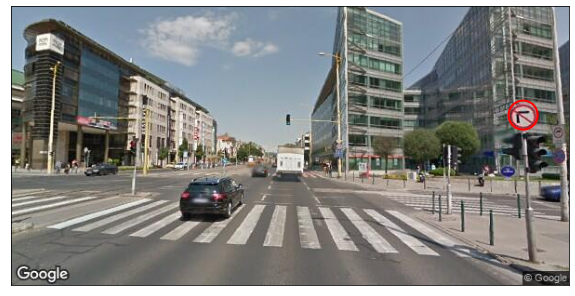

Centers: [[[504.5  52.5  19. ]]]


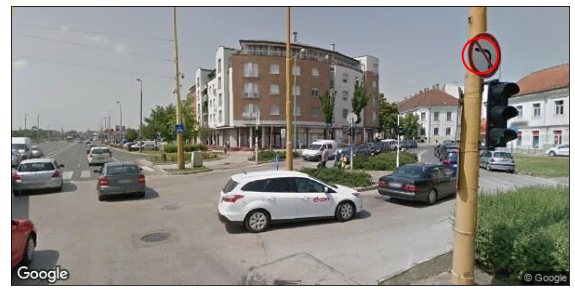

Centers: [[[545.5  97.5  16.6]]]


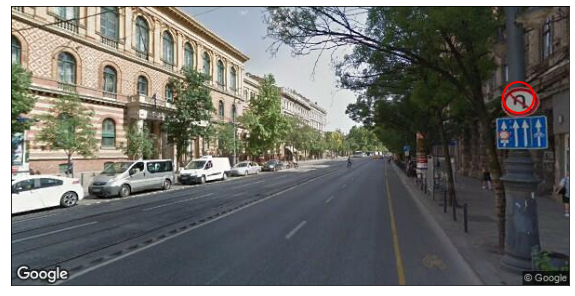

In [30]:
matching_circles = []

for img, seg in zip(images, segmented_images):
  matching_circles.append(find_circles(seg,img)[0])

After getting the center and radius of the sign, we need to get the image, and add a small border for better recognition.

[[521.5  88.5  34.4]
 [468.5  62.5  22.9]]


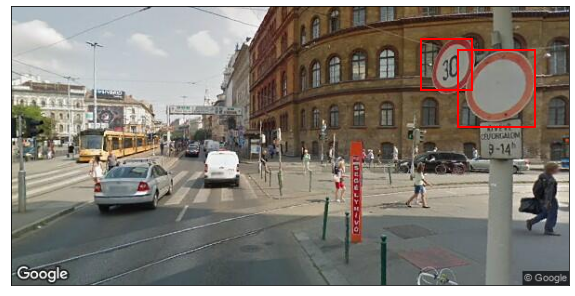

[[ 69.5 124.5  13.4]]


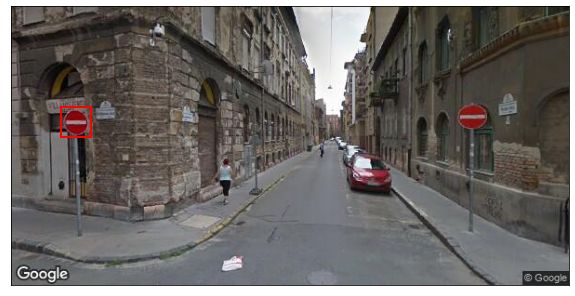

[[563.5 138.5  18.1]
 [565.5  70.5  20.5]]


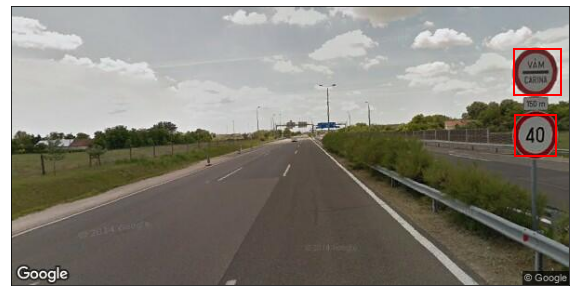

[[456.5 220.5  18.5]
 [460.5 171.5  18. ]]


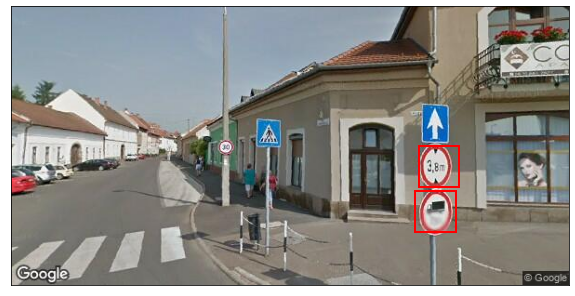

[[448.5 143.5  17.7]
 [449.5  96.5  22.7]]


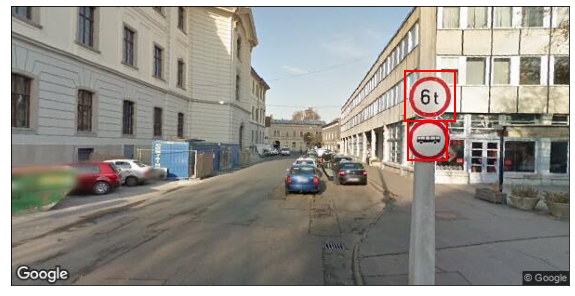

[[525.5 135.5  16.6]
 [576.5 118.5  21.7]]


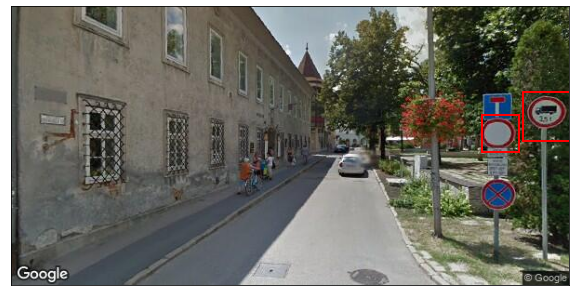

[[473.5 206.5  21. ]
 [472.5 157.5  19.4]]


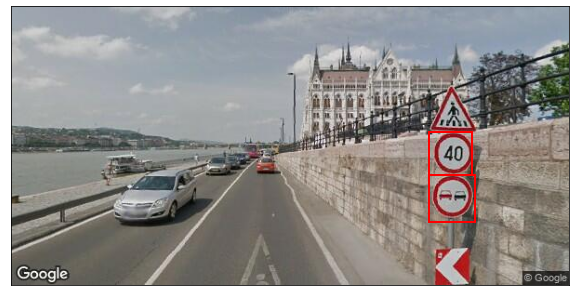

[[541.5 152.5  16.9]
 [536.5 205.5  16. ]]


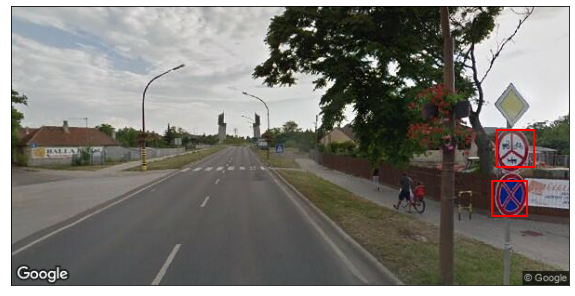

[]


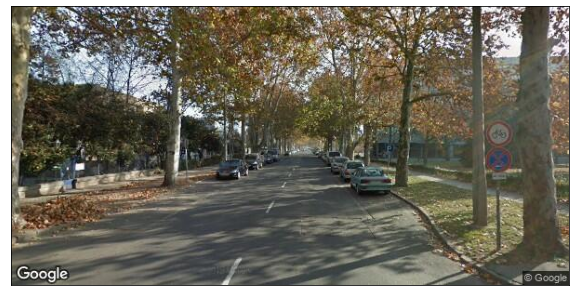

[[539.5 125.5  15.8]
 [224.5 187.5  10.2]]


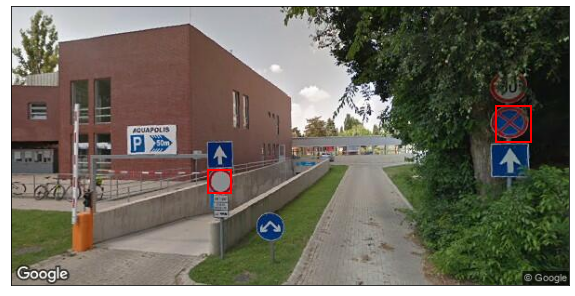

[]


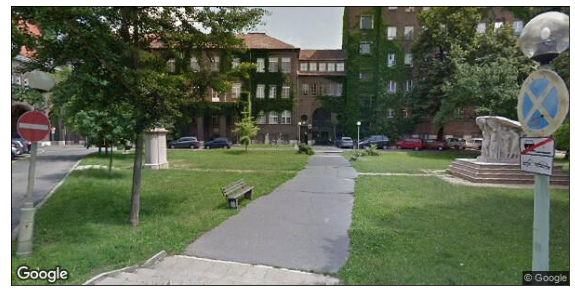

[[537.5 198.5  13.8]
 [538.5 159.5  16.7]]


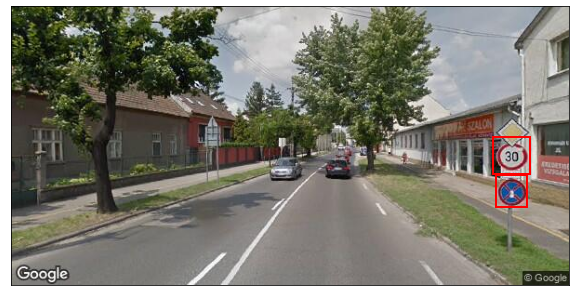

[[444.5 133.5   9.6]
 [444.5 106.5  11. ]]


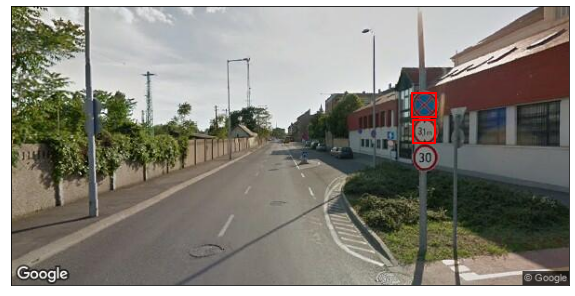

[[483.5 185.5  22.9]]


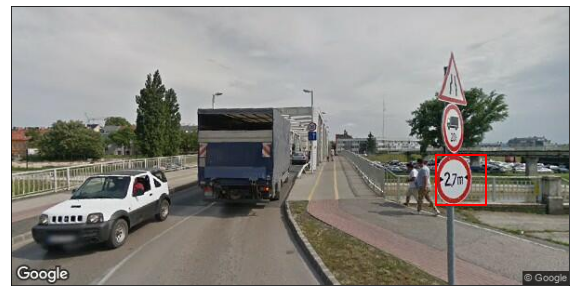

[[467.5 107.5  14.1]
 [470.5  42.5  12.7]
 [473.5  78.5  15.9]]


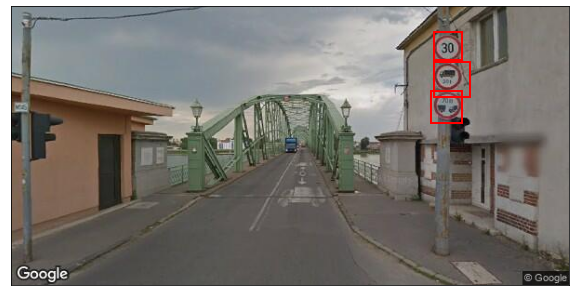

[[ 49.5 186.5  12.7]
 [ 48.5 160.5   9.6]
 [ 49.5 135.5   9.4]
 [462.5 177.5   7.3]]


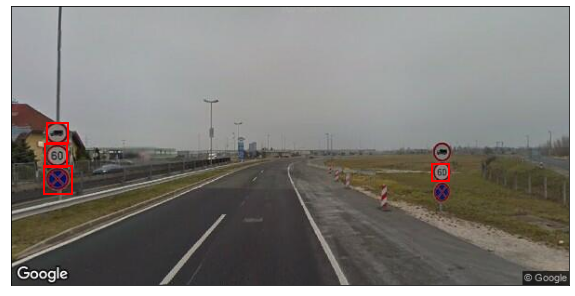

[[547.5 257.5  20.7]]


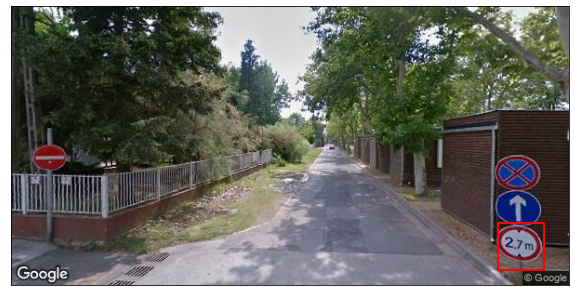

[[550.5 116.5  15.6]]


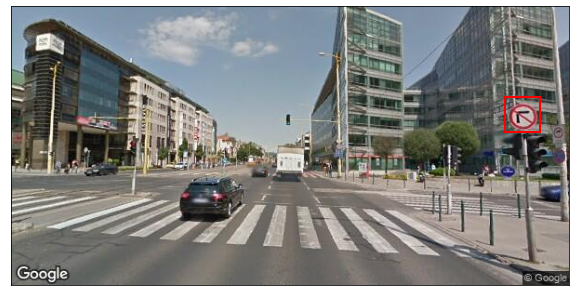

[[504.5  52.5  19. ]]


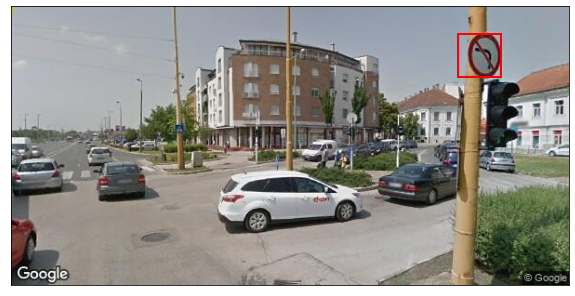

[[545.5  97.5  16.6]]


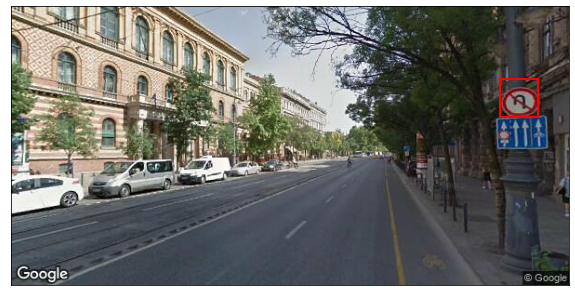

In [31]:
signs = []

border_percentage = 0.2

for img, circles in zip(images, matching_circles):
  fig, (ax1) = plt.subplots(1,figsize=(10,10))
  plt.xticks([]),plt.yticks([])
  ax1.imshow(img);

  print(circles)

  for circle in circles:
    x, y, r = circle
    x = round(x)
    y = round(y)
    border = round(r * (1 + border_percentage))
    signs.append(img[y-border:y+border,x-border:x+border])
    rectBorder = matplotlib.patches.Rectangle((x-border, y-border), 2 * border, 2 * border, edgecolor="red", linewidth=2, fill=False)
    ax1.add_patch(rectBorder)

  plt.show()

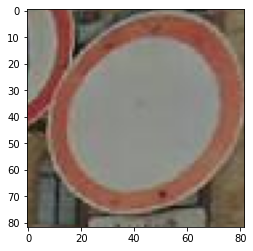

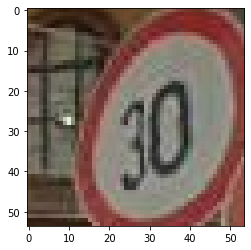

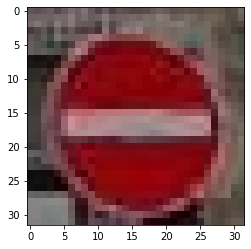

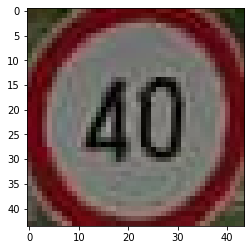

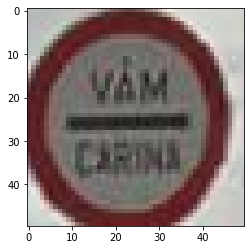

...

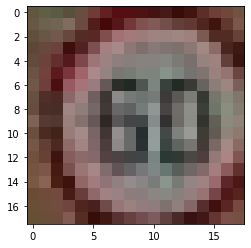

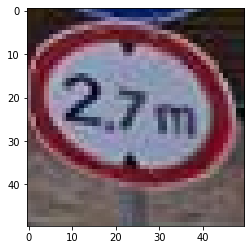

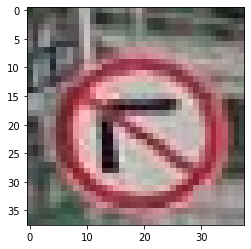

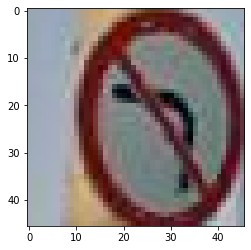

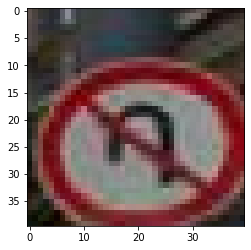

In [32]:
for sign in signs:
  imgplot = plt.imshow(sign)
  plt.show()

## Classification

After some different methodologies for the traffic sign classification, we found the best way to be to divide the classification into two steps:
1. Detect the blue color for the *E* category, as it is the easiest to classify and most different from the other;
2. Use template matching to classify the other signs

In [33]:
def check_for_blue_percentage(sign):
  lower_range = np.array([90,190,20])
  upper_range = np.array([150,255,255])

  hsv = cv2.cvtColor(sign, cv2.COLOR_RGB2HSV)
  mask = cv2.inRange(hsv, lower_range, upper_range)

  ratio_blue = cv2.countNonZero(mask) / (sign.size / 3)

  return ratio_blue > 0.1

In [34]:
# Helper functions to load the templates

def split_vertically(img, N):
  images = []
  h, w, _ = img.shape
  width = w // N

  for i in range(N):
    temp = img[:, i * width:(i + 1) * width]
    images.append(temp)
  
  return images

def split_horizontally(img, N):
  images = []
  h, w, _ = img.shape
  height = h // N

  for i in range(N):
    temp = img[i * height:(i + 1) * height, :]
    images.append(temp)
  
  return images

In [35]:
def load_templates():
  templates = []

  path = "/content/drive/MyDrive/traffic/traffic_sign_categories/"
  categories = ['a', 'b', 'c', 'd', 'f'] # We exclude class E because we have a good way of recognizing those signs by their color

  template_dim = (50, 50)

  for c in categories:
    img_path = path + c + ".png"
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img = cv2.medianBlur(img, 5)

    if c == 'a' or c == 'b':    
      images = split_vertically(img, 3) # Split into 3
      for i in range(len(images)):
        images[i] = cv2.resize(images[i], template_dim)
      templates.append(images)
    elif c == 'f':
      rows = split_horizontally(img, 3) # Split into 3 rows
      images = []
      for row in rows:
        temp = split_vertically(row, 8) # Split into 8 columns
        for i in temp:
          i = cv2.resize(i, template_dim)
          images.append(i)
      templates.append(images)
    else:
      img = cv2.resize(img, template_dim)
      templates.append([img])

  return templates

In [36]:
def template_matching(img, templates, threshold = 0.50):
  img = img - cv2.erode(img, None)

  # plt.imshow(img, cmap = 'gray')
  # plt.show()

  i = (0, 0)
  best_value = 0
  best_index = (-1, -1)

  for class_templates in templates:
    for template in class_templates: 
      template = cv2.GaussianBlur(template, (5,5), 0)
      template = template - cv2.erode(template, None)
      res = cv2.matchTemplate(img, template, cv2.TM_CCOEFF_NORMED)
      min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

      if max_val > best_value:
        best_value = max_val
        best_index = i

      i = (i[0], i[1] + 1)
    
    i = (i[0] + 1, 0)
    
  # print('Best value:', best_value)
  # plt.imshow(templates[best_index[0]][best_index[1]], cmap = 'gray')
  # plt.show()

  return best_index[0]

In [37]:
templates = load_templates()

In [38]:
def classify_sign(sign):
  if check_for_blue_percentage(sign):
    return 'E'

  classes = ['A', 'B', 'C', 'D', 'F']

  return classes[template_matching(sign, templates)]

In [39]:
classifications = list(map(classify_sign, signs))

classifications

['C',
 'B',
 'D',
 'B',
 'A',
 'F',
 'F',
 'B',
 'B',
 'C',
 'F',
 'F',
 'F',
 'B',
 'E',
 'E',
 'C',
 'E',
 'F',
 'F',
 'E',
 'F',
 'F',
 'B',
 'F',
 'E',
 'F',
 'F',
 'F',
 'F',
 'F',
 'F',
 'A']

## Evaluation

We will assume the signs that were not detected are considered wrong when trying to evaluate and measure the accuracy of this model.

- There were 33/45 signs detected. Or 33/47 signs if we count with the optional ones.
- There were 2 images where there weren't any signs detected, which were images number 9 and 11. 

In [40]:
# These are the detected sign categories, that will be used to measure the accuracy of the previous classification method
detected_sign_categories = [
  'C', 'B', 
  'D',
  'B', 'F', 
  'F', 'F', 
  'F', 'F', 
  'C', 'F', 
  'F', 'B', 
  'F', 'E',
  # No signs detected on image number 9
  'E', 'C', 
  # No signs detected on image number 11
  'E', 'B', 
  'F', 'E', 
  'F', 
  'F', 'B', 'F', 
  'E', 'B', 'F', 'B', 
  'F', 
  'A', 
  'A', 
  'A' 
]

As we can see, 73% of the signs were recognized. The unrecognized signs were mostly due to light, where the red of the sign was not in the HSV range specified above due to different light conditions. 

In [41]:
detection_acuracy = len(classifications) / 45
print('Detection Acuracy:', detection_acuracy)

Detection Acuracy: 0.7333333333333333


From the classification results shown below, we got around 70% acuracy, which was pretty good, considering that we hadn't got templates for every sign and the different conditions of the images (templates had very good quality and the found signs were very noisy).

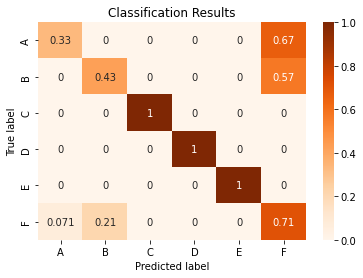

Classification Acuracy: 0.696969696969697


In [42]:
cm = metrics.confusion_matrix(detected_sign_categories, classifications)
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure()

heatmap = sns.heatmap(cm, annot = True, cmap = "Oranges")

heatmap.xaxis.set_ticklabels(['A', 'B', 'C', 'D', 'E', 'F'])
heatmap.yaxis.set_ticklabels(['A', 'B', 'C', 'D', 'E', 'F'])

plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('Classification Results')

plt.show()  

classification_acuracy = metrics.accuracy_score(detected_sign_categories, classifications)
print('Classification Acuracy:', classification_acuracy)

Overall, merging the detection acuracy and the classification acuracy we got 51%. Half of the signs were correctly recognized and classified.

In [43]:
print('Overall Acuracy:', classification_acuracy * detection_acuracy)

Overall Acuracy: 0.5111111111111111
